In [1]:
from __future__ import print_function
import PIL
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
plt.rcParams.update({'font.size': 16})
import csv
import corner
import tqdm

from mpl_toolkits import mplot3d
from matplotlib.pyplot import text
from IPython.display import display, Math, Latex, Markdown
import os
from tqdm.notebook import tqdm
import random
import seaborn as sns
%matplotlib inline
%config InlineBackend.figure_format='retina'

import scipy.stats
from scipy.stats import norm
from scipy.stats import uniform

from astroML import stats as astroMLstatsπ
from astroML.linear_model import LinearRegression
from astroML.classification import GMMBayes


from scipy import stats, interpolate
from astropy.visualization import hist

import sklearn
from sklearn import datasets, preprocessing
from sklearn.manifold import Isomap
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans, MeanShift, estimate_bandwidth
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.mixture import GaussianMixture, BayesianGaussianMixture
from sklearn.gaussian_process import GaussianProcessRegressor, kernels
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier

/home/olga/anaconda3/lib/python3.9/site-packages/astroML/linear_model/linear_regression_errors.py:10: UserWarning: LinearRegressionwithErrors requires PyMC3 to be installed
  warnings.warn('LinearRegressionwithErrors requires PyMC3 to be installed')


# Gravitational waves detection

We want to know if gw could be detected based on some simulated data we have. 
Let's use some classifier to try to predict their detectability $\rightarrow$ best results with redshift and masses

In [2]:
import h5py

f1 = h5py.File('sample_2e7_design_precessing_higherordermodes_3detectors.h5', 'r')
all_labels = list(f1.keys())
labels = ['chi1x', 'chi1y', 'chi1z', 'chi2x', 'chi2y', 'chi2z', 'dec', 'iota', 'mtot', 'psi', 'q', 'ra', 'z']
cool_labels1 = [r'$\chi_{1,x}$', r'$\chi_{1,y}$', r'$\chi_{1,z}$', r'$\chi_{2,x}$', r'$\chi_{2,y}$', r'$\chi_{2,z}$', 
          'dec', 'det', r'$\iota$', '$m_{tot}$', r'$\psi$', 'q', 'ra', 'snr', 'z']
cool_labels2 = [r'$\chi_{1,x}$', r'$\chi_{1,y}$', r'$\chi_{1,z}$', r'$\chi_{2,x}$', r'$\chi_{2,y}$', 
                r'$\chi_{2,z}$', 'dec', r'$\iota$', '$m_{tot}$', r'$\psi$', 'q', 'ra', 'z']
print(all_labels, labels)

m_tot = np.array(f1['mtot'])#[:,np.newaxis]   #add newaxis to change shape in (N,1)
z = np.array(f1['z'])
snr = np.array(f1['snr'])
m_tot.shape

['chi1x', 'chi1y', 'chi1z', 'chi2x', 'chi2y', 'chi2z', 'dec', 'det', 'iota', 'mtot', 'psi', 'q', 'ra', 'snr', 'z'] ['chi1x', 'chi1y', 'chi1z', 'chi2x', 'chi2y', 'chi2z', 'dec', 'iota', 'mtot', 'psi', 'q', 'ra', 'z']


(20000000,)

In [3]:
cut=int(1e5)
X=[]
for l in labels:

    X.append(f1[l][:cut])
X = np.array(X).T

y = np.array(f1['det'][:cut])
X[:,8].shape
y

array([0, 0, 0, ..., 1, 1, 1])

## Play with the data
Let's try to visualize all these bounch of data, what are they telling us? 

------
The _hint_ was that the most important features are mass and redshift, but we see that for redshift we are largely biased by selection problems

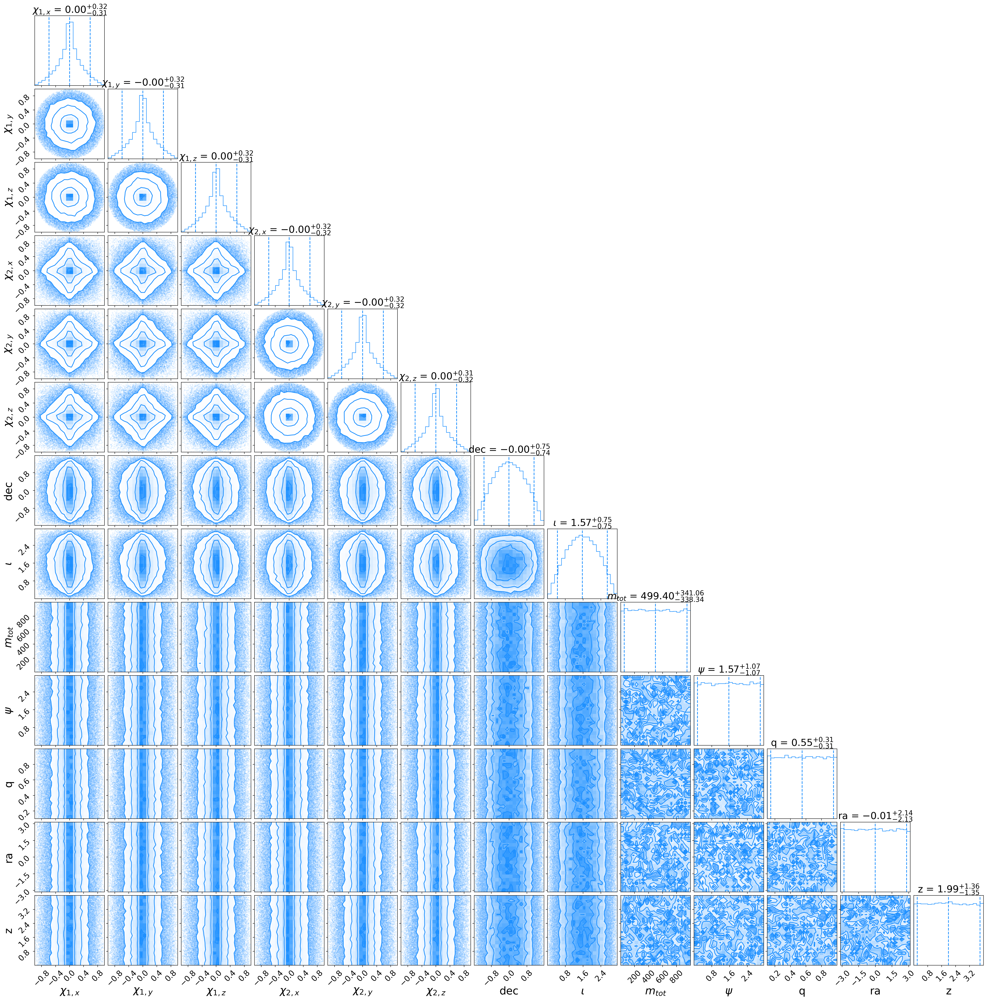

In [4]:
fig = corner.corner(X, labels=cool_labels2, quantiles=[0.05, 0.5, 0.95],color='dodgerblue', truth_color='black', 
show_titles=True, title_kwargs={"fontsize": 20}, label_kwargs=dict(fontsize=22), figsize=(16, 20));

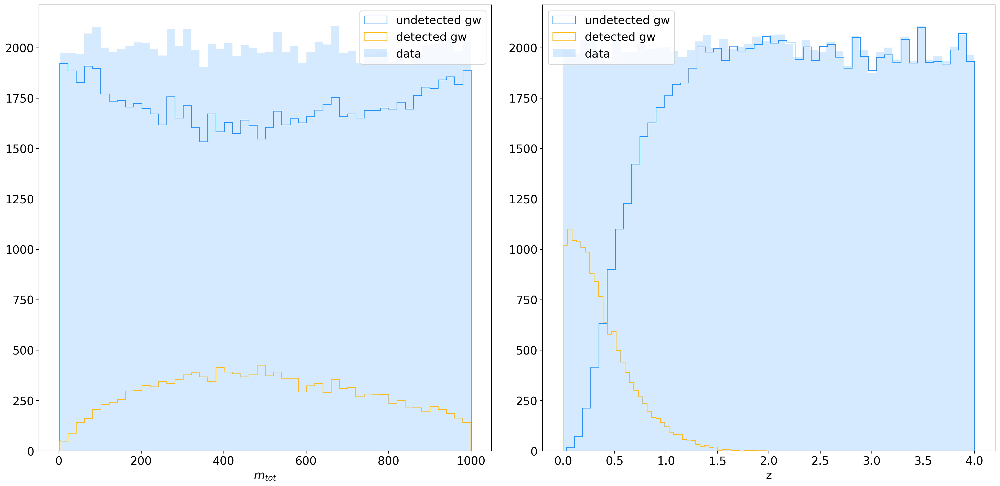

In [5]:
fig, axs = plt.subplots(1, 2, figsize=(20, 10))

for ax, data, xlabel in zip(axs.flatten(), X[:,8::4].T, cool_labels2[8::4]):
    
    ax.hist(data[y==0], bins=50, histtype = 'step', label = 'undetected gw', lw=1, color='dodgerblue')
    ax.hist(data[y==1], bins=50, histtype = 'step', label = 'detected gw', lw=1, color='xkcd:orangey yellow')
    ax.hist(data, bins=50, label = 'data', color='xkcd:sky blue', alpha=0.3, zorder=0)
    ax.legend()
    ax.set_xlabel(xlabel)
    
plt.tight_layout(pad=1.5);

## Random forest

Let's find the optimal tree depth for the random forest with a cross-validation and choose the value for which the rms error is minimized.\
Then run the random forest

In [6]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

In [7]:
# Compute the cross-validation scores for several tree depths (no K-Fold due to computational issues)

depth = np.arange(1, 30)
rms_test = np.zeros(len(depth))
rms_train = np.zeros(len(depth))
i_best = 0
y_fit_best = None

for i, d in tqdm(enumerate(depth)):
    
    clf = RandomForestClassifier(max_depth=d, random_state=0)
    clf.fit(X_train, y_train)

    y_fit_train = clf.predict(X_train)
    y_fit = clf.predict(X_test)
    rms_train[i] = np.mean(np.sqrt((y_fit_train - y_train) ** 2))
    rms_test[i] = np.mean(np.sqrt((y_fit - y_test) ** 2))

    if rms_test[i] <= rms_test[i_best]:
        i_best = i
        y_fit_best = y_fit

best_depth = depth[i_best]

print("best depth:", best_depth)

0it [00:00, ?it/s]

best depth: 22


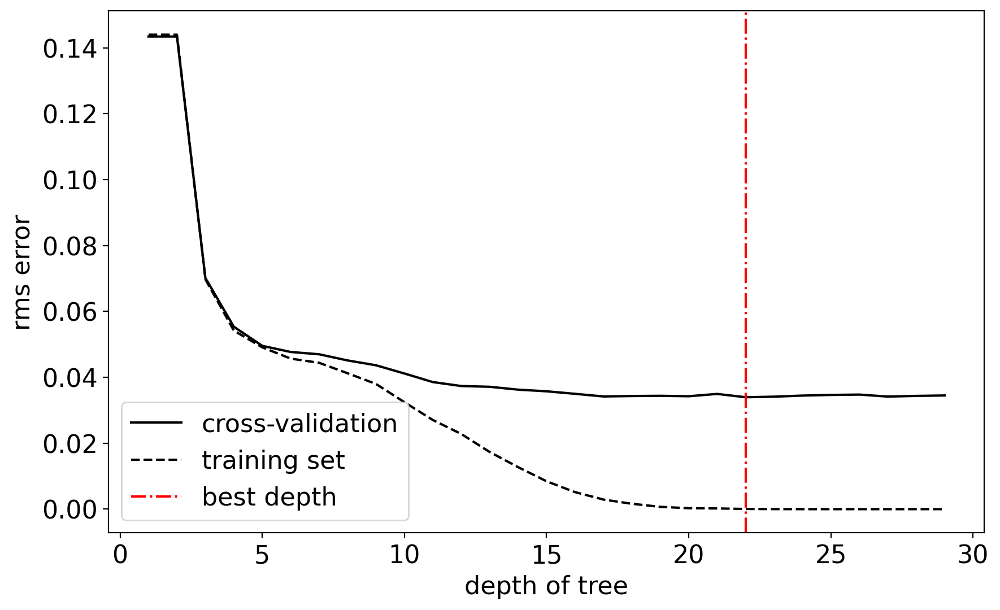

In [8]:
plt.figure(figsize=(10, 6))
plt.plot(depth, rms_test, '-k', label='cross-validation')
plt.plot(depth, rms_train, '--k', label='training set')
plt.axvline(x=best_depth, c='red', linestyle='-.', label='best depth')
plt.xlabel('depth of tree')
plt.ylabel('rms error')

plt.legend(loc='lower left');

In [9]:
ranfor = RandomForestClassifier(best_depth)
ranfor.fit(X_train, y_train)

RandomForestClassifier(n_estimators=22)

In [10]:
y_pred = ranfor.predict(X_test)
C = sklearn.metrics.confusion_matrix(y_test, y_pred)
tn, fp, fn, tp = C.ravel()
print("completeness test", tp/(tp+fn))
print("contamination test", fp/(tp+fp))
print("accuracy test", (tp+tn)/len(y_test))

y_pred = ranfor.predict(X_train)
C = sklearn.metrics.confusion_matrix(y_train, y_pred)
tn, fp, fn, tp = C.ravel()
print("\ncompleteness train", tp/(tp+fn))
print("contamination train", fp/(tp+fp))
print("accuracy train", (tp+tn)/len(y_train))

completeness test 0.8356960260283524
contamination test 0.09443465122135482
accuracy test 0.9639333333333333

completeness train 0.9966266494691933
contamination train 0.0005969555268132525
accuracy train 0.9994285714285714


In [11]:
y_pred = ranfor.predict(X_test)
C = sklearn.metrics.confusion_matrix(y_test, y_pred)
accu_for = np.sum(C.diagonal())/len(y_test)
print("Fraction of correct sources is: ", accu_for)

Fraction of correct sources is:  0.9639333333333333


## Decision tree and bagging
Let's try other algorithms, e. g. standard decision tree together with bagging: first compute the best depth for a decision tree classifier with ``GridSearchCV`` and compute accuracy. Then put that optimal depth also in the ``BaggingClassifier`` and compare the two accuracies.

In [12]:
clf_tree = DecisionTreeClassifier()
drange = np.arange(1,30)  #Complete

grid = GridSearchCV(clf_tree, param_grid={'max_depth': drange}, cv=5) #Complete
grid.fit(X, y)

best = grid.best_params_['max_depth']
print("best parameter choice:", best)

best parameter choice: 8


In [13]:
dt = DecisionTreeClassifier(random_state=0, max_depth=best, criterion='entropy')
dt.fit(X, y)
y_pred_tree = dt.predict(X_test)

In [14]:
bag_clf = BaggingClassifier(DecisionTreeClassifier(random_state=42, max_depth=best, criterion='entropy'), 
    n_estimators=500, max_samples=100, bootstrap=True, random_state=42, n_jobs=-1)

%timeit bag_clf.fit(X_train, y_train)

y_pred_bag = bag_clf.predict(X_test)

1.42 s ± 14 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [15]:
print("Accuracy with random forest: ", accu_for)
print("Accuracy with a standard decision tree: ", accuracy_score(y_test, y_pred_tree))
print("Accuracy with bagging (boostrap+aggragating): ",accuracy_score(y_test, y_pred_bag))

Accuracy with random forest:  0.9639333333333333
Accuracy with a standard decision tree:  0.9631
Accuracy with bagging (boostrap+aggragating):  0.9435
